#Quiz 4
This notebook is created by Chinchuthakun Worameth as a part of Complex Network (ART.T462) at Tokyo Institute of Technology taught in Fall semester 2021 by Prof. Murata Tsuyoshi. It contains
* A program of simulating random walks on a graph

##Question #1

Let $\mathbf{G} = (\mathbf{V},\mathbf{E})$ and $\mathbf{A}$ be an undirected graph and an adjacency matrix associated with $\mathbf{G}$, respectively. Given that $k_i$ denotes the degree of node with index $i$, we can define $p_{i}(t)$, the probability that the walk is at node $i$ at time $t$ is

$$
p_i(t) = \sum_j \frac{A_{ij}}{k_j}p_j(t-1)
$$

which can be expressed by using matrix notation as

$$
\mathbf{p}(t) = \mathbf{A}\mathbf{D}^{-1}\mathbf{p}(t-1)
$$

where $\mathbf{D}^{-1}$ is a diagonal matrix such that $\mathbf{D}_{ii} = 1 / k_i$.

In [1]:
import numpy as np
A = np.matrix([[0, 1, 0, 0], [1, 0, 1, 1], [0, 1, 0, 1], [0, 1, 1, 0]], dtype=float)
print(f"A = \n{A}")
D = np.diag(np.sum(np.array(A), axis=0))
print(f"D = \n{D}")
D_inv = np.diag(1 / np.sum(np.array(A), axis=0))
print(f"D^-1 = \n{D_inv}")
print(f"AD^-1 = \n{A @ D_inv}")

A = 
[[0. 1. 0. 0.]
 [1. 0. 1. 1.]
 [0. 1. 0. 1.]
 [0. 1. 1. 0.]]
D = 
[[1. 0. 0. 0.]
 [0. 3. 0. 0.]
 [0. 0. 2. 0.]
 [0. 0. 0. 2.]]
D^-1 = 
[[1.         0.         0.         0.        ]
 [0.         0.33333333 0.         0.        ]
 [0.         0.         0.5        0.        ]
 [0.         0.         0.         0.5       ]]
AD^-1 = 
[[0.         0.33333333 0.         0.        ]
 [1.         0.         0.5        0.5       ]
 [0.         0.33333333 0.         0.5       ]
 [0.         0.33333333 0.5        0.        ]]


When $t \rightarrow \infty$, we have $\mathbf{p} = \mathbf{A}\mathbf{D}^{-1}\mathbf{p}$, which implies that $\mathbf{D}^{-1}\mathbf{p}$ is an eigenvector of the graph Laplacian $\mathbf{L}$ with eigenvalue $0$. That is, $\mathbf{L}\mathbf{D}^{-1}\mathbf{p} = 0$.

Assuming that $\mathbf{G}$ is connected, $\mathbf{D}^{-1}\mathbf{p}$ can only be expressed as $a\mathbf{1}$ where $a$ is a constant. Therefore,

$$
\mathbf{p} = a\mathbf{D}\mathbf{1} = \begin{bmatrix} ak_1 \ldots ak_n\end{bmatrix}^T \equiv \frac{1}{2m}\begin{bmatrix} k_1 \ldots k_n\end{bmatrix}^T
$$
where $2m = \sum_j k_j$ is the sum of degree of every nodes in $\mathbf{G}$.

In [2]:
m = np.sum(D) / 2.
p = D @ np.ones(D.shape[0]) / (2. * m)
print(f"probability = {p}")

probability = [0.125 0.375 0.25  0.25 ]


##Question #2

Now, we will create a program to simulate a random walk on the graph illustrated below.

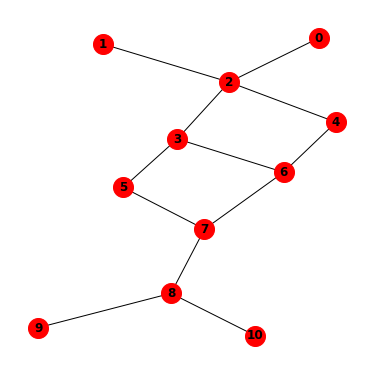

In [3]:
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np

G = nx.Graph()
G.add_nodes_from(range(0,10))
G.add_edges_from([(0,2),(1,2),(2,3),(2,4),(3,5),(3,6),(4,6),(5,7),(6,7),(7,8),(8,9),(8,10)])
plt.figure(figsize=(5, 5))
nx.draw_spring(G, node_size=400, node_color='red', with_labels=True, font_weight='bold')

First, we create `RandomWalk` class with the following functions:
* `step` : move one step from the current node to one of its neighbor nodes
* `walk` : move one step at a time until the current time step becomes $t$.
* `visualize` : visualize the visited count for each node at time step $t$ and error from its theoretical values.

In [4]:
import matplotlib.animation as animation
from IPython.display import HTML

In [5]:
class RandomWalk:
  def __init__(self, G, start_node):
    self.G = G
    self.A = nx.adjacency_matrix(G).todense()
    self.A = np.array(self.A, dtype = np.float64)
    self.ideal = np.sum(np.array(self.A), axis=0) / np.sum(self.A).astype(float)
    
    self.count = np.zeros(G.number_of_nodes())
    self.start_node = start_node
    self.visited = []
    self.now = -1

  def visualize(self, p, t):
    ax.clear()
    ax.set_title(f"Number of times that each node are visited (started at node 0) / step = {t}", fontsize=20)
    ax.set_xlabel("Index of node", fontsize=16)
    ax.set_ylabel("Count (divided by total count)", fontsize=16)
    ax.bar(range(p.size), p, 0.5, tick_label = list(map(str,range(p.size))), label="#visited", color="royalblue")
    if t > 0:
      ax.set_ylim(ymin=0.0, ymax=0.2)
      ax.bar(range(p.size), 5 * np.abs(p - self.ideal), 0.5, tick_label = list(map(str,range(p.size))), label="5 times of error from ideal", color="darkred")
    ax.legend(fontsize=16)
    plt.show()
  
  def step(self):
    if self.now == -1:
      next_node = self.start_node
    else:
      neighbor = np.argwhere(self.A[self.visited[-1]] > 0)
      next_node = np.random.choice(neighbor.astype(int).squeeze(axis=1))
    self.count[next_node] += 1
    self.visited.append(next_node)
    self.now += 1
    return self.count / (self.now + 1.)

  def walk(self, t, verbose=True):
    p = self.count / (self.now + 1.)
    for i in range(self.now, t):  p = self.step()
    if verbose: print(f"Time step {t}: {np.around(p,3)} ===> {np.sum(p)}")
    self.visualize(p,t)

Then, we simulate a random walk of legnth 100,000 steps and generate an animation to illustrate the result. $x$-axis and $y$-axis are nodes' indices and visited count for each node (divided by the total count), respectively. The animation shows the result every 500 time steps. Note that the errors are multiplied by 5 for visualization purposes.

**As illustrated in the animation, the most visited node is #2. The result corresponds with the fact that node #2 has the most degree.**

Ideal = [0.042 0.042 0.167 0.125 0.083 0.083 0.125 0.125 0.125 0.042 0.042]
Time step 0: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ===> 1.0


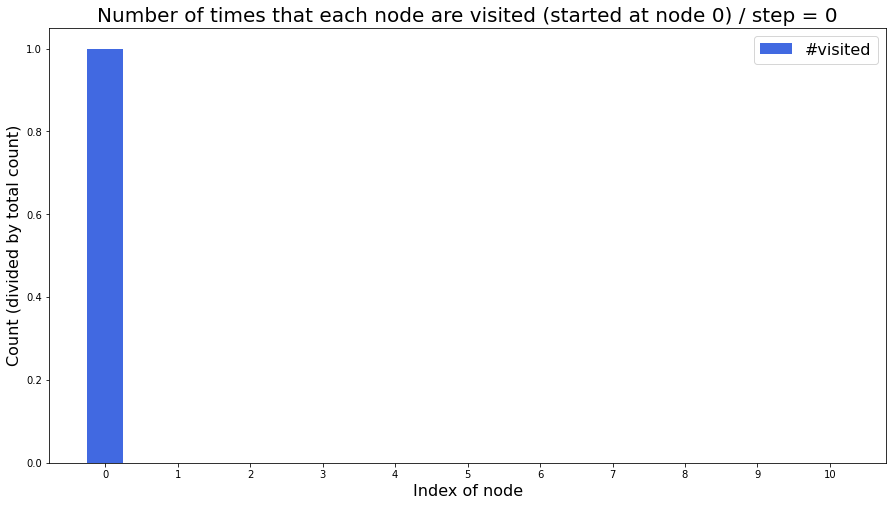

In [6]:
np.seterr(divide='ignore', invalid='ignore')
fig, ax = plt.subplots(figsize=(15, 8))
simulation = RandomWalk(G, start_node=0)
print(f"Ideal = {np.around(simulation.ideal,3)}")
animator = animation.FuncAnimation(fig, simulation.walk, frames=range(0,100000,500))

In [7]:
HTML(animator.to_jshtml())

Time step 0: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ===> 1.0
Time step 0: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] ===> 1.0
Time step 500: [0.038 0.042 0.182 0.136 0.092 0.092 0.11  0.116 0.116 0.04  0.038] ===> 0.9999999999999999
Time step 1000: [0.027 0.041 0.158 0.131 0.088 0.1   0.13  0.145 0.112 0.036 0.033] ===> 1.0
Time step 1500: [0.028 0.033 0.148 0.137 0.088 0.099 0.141 0.145 0.112 0.037 0.033] ===> 1.0
Time step 2000: [0.035 0.04  0.16  0.134 0.086 0.095 0.133 0.135 0.111 0.038 0.032] ===> 1.0
Time step 2500: [0.035 0.041 0.166 0.132 0.088 0.09  0.128 0.127 0.116 0.039 0.038] ===> 0.9999999999999998
Time step 3000: [0.042 0.04  0.175 0.132 0.091 0.086 0.127 0.122 0.112 0.039 0.034] ===> 1.0
Time step 3500: [0.042 0.04  0.174 0.131 0.09  0.083 0.128 0.12  0.115 0.043 0.035] ===> 0.9999999999999999
Time step 4000: [0.041 0.039 0.167 0.128 0.086 0.083 0.128 0.126 0.121 0.043 0.037] ===> 1.0
Time step 4500: [0.047 0.04  0.172 0.125 0.085 0.081 0.126 0.123 0.121 0.044 0.038] ===> 1.0
Time 